In [1]:
import anndata as ad
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd

RESULT_DIR = '/fs/ess/PAS1475/yzhong/sf_project/scripts/Xenium_lung_benchmark/spaGFM_dir/05_19_26/knn_TNiche_sample_0.2'
LABEL = 'TNiche'
SPLIT = 'sample'
METHODS = {'spaGFM_8': 'spaGFM', 'Novae': 'Novae'}


In [2]:
adatas = {
    method: ad.read_h5ad(f'{RESULT_DIR}/{method}_knn_predictions.h5ad', backed='r')
    for method in METHODS
}

classes = [str(label) for label in adatas['spaGFM_8'].uns['spaGFM_8_knn_pred_seed_0_classes']]
for method, adata in adatas.items():
    method_classes = [str(label) for label in adata.uns[f'{method}_knn_pred_seed_0_classes']]
    if method_classes != classes:
        raise ValueError(f'{method} uses a different class order')

targets = pd.Categorical(adatas['spaGFM_8'].obs[LABEL].astype(str), categories=classes).codes
if (targets < 0).any():
    raise ValueError(f'Unknown {LABEL} labels found')
samples = adatas['spaGFM_8'].obs[SPLIT].astype(str).to_numpy()


In [3]:
def scores(y_true, y_pred, n_classes):
    """Macro F1, macro accuracy (recall), and multiclass MCC."""
    y_true = np.asarray(y_true, dtype=np.int64)
    y_pred = np.asarray(y_pred, dtype=np.int64)
    confusion = np.bincount(
        y_true * n_classes + y_pred, minlength=n_classes ** 2
    ).reshape(n_classes, n_classes)
    true_positive = np.diag(confusion).astype(float)
    # Squared cell counts can exceed int64, so MCC aggregates are floats.
    support = confusion.sum(axis=1, dtype=float)
    predicted = confusion.sum(axis=0, dtype=float)
    f1 = np.divide(2 * true_positive, support + predicted, out=np.zeros(n_classes), where=(support + predicted) != 0)
    recall = np.divide(true_positive, support, out=np.zeros(n_classes), where=support != 0)
    total = float(confusion.sum())
    numerator = total * true_positive.sum() - np.dot(support, predicted)
    denominator = np.sqrt((total ** 2 - np.dot(predicted, predicted)) * (total ** 2 - np.dot(support, support)))
    return {'F1-macro': f1.mean(), 'MCC': numerator / denominator if denominator else 0, 'Accuracy': recall.mean()}

def heldout_predictions(adata, method, seed):
    probabilities = np.asarray(adata.obsm[f'{method}_knn_pred_seed_{seed}'])
    valid = np.isfinite(probabilities).all(axis=1)
    return valid, probabilities[valid].argmax(axis=1)


,method,f1_macro_mean,f1_macro_std,mcc_mean,mcc_std,accuracy_macro_mean,accuracy_macro_std
0,Novae,0.343150,0.008608,0.259688,0.009329,0.356717,0.005220
1,spaGFM_8,0.607174,0.003463,0.546903,0.005020,0.632179,0.006466


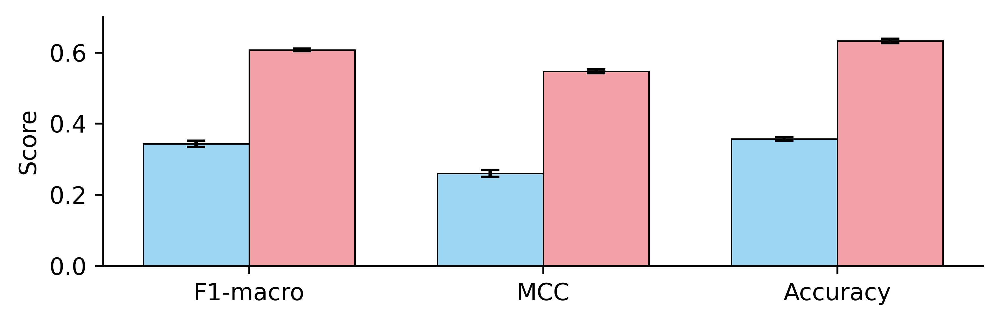

In [4]:
records = []
for method in METHODS:
    for seed in range(10):
        valid, predictions = heldout_predictions(adatas[method], method, seed)
        records.append({'method': method, 'seed': seed, **scores(targets[valid], predictions, len(classes))})

performance = pd.DataFrame(records)
metrics_summary = performance.groupby('method', as_index=False).agg(
    f1_macro_mean=('F1-macro', 'mean'), f1_macro_std=('F1-macro', 'std'),
    mcc_mean=('MCC', 'mean'), mcc_std=('MCC', 'std'),
    accuracy_macro_mean=('Accuracy', 'mean'), accuracy_macro_std=('Accuracy', 'std'),
)
display(metrics_summary)

# The styling and hidden legend follow check_knn_TNiche_res_sample_cell_plot.ipynb.
plot_methods = ['Novae', 'spaGFM_8']
plot_labels = {'Novae': 'Novae', 'spaGFM_8': 'spaGFM'}
plot_colors = {'Novae': '#9BD7F3', 'spaGFM_8': '#F2A1A7'}
plot_metrics = [('f1_macro', 'F1-macro'), ('mcc', 'MCC'), ('accuracy_macro', 'Accuracy')]
overall_summary = metrics_summary.set_index('method').loc[plot_methods]
fig, ax = plt.subplots(figsize=(6, 2), dpi=600)
x = np.arange(len(plot_metrics))
bar_width = 0.36
for method_index, method in enumerate(plot_methods):
    offset = (method_index - 0.5) * bar_width
    values = [overall_summary.loc[method, f'{metric}_mean'] for metric, _ in plot_metrics]
    errors = [overall_summary.loc[method, f'{metric}_std'] for metric, _ in plot_metrics]
    ax.bar(x + offset, values, bar_width, yerr=errors, capsize=4, color=plot_colors[method], edgecolor='black', linewidth=0.6, label=plot_labels[method])
ax.set_xticks(x, [label for _, label in plot_metrics])
ax.set_ylabel('Score')
ax.set_ylim(0, 0.7)
ax.spines[['top', 'right']].set_visible(False)
fig.tight_layout()
plt.show()

In [5]:
# Pick the spaGFM seed/sample pair with the highest held-out per-sample F1-macro.
best = {'f1': -np.inf}
for seed in range(10):
    valid, predictions = heldout_predictions(adatas['spaGFM_8'], 'spaGFM_8', seed)
    for sample in np.unique(samples[valid]):
        mask = valid & (samples == sample)
        f1 = scores(targets[mask], np.asarray(adatas['spaGFM_8'].obsm[f'spaGFM_8_knn_pred_seed_{seed}'])[mask].argmax(axis=1), len(classes))['F1-macro']
        if f1 > best['f1']:
            best = {'seed': seed, 'sample': sample, 'f1': f1}

best_result = pd.Series({'seed': best['seed'], 'sample': best['sample'], 'f1_macro': best['f1']})
best_seed = int(best_result['seed'])
best_sample = best_result['sample']
sample_mask = samples == best_sample
plot_data = adatas['spaGFM_8'].obs.loc[sample_mask, [LABEL, 'x_centroid', 'y_centroid']].copy()
plot_data['reference_code'] = targets[sample_mask]
for method in METHODS:
    probabilities = np.asarray(adatas[method].obsm[f'{method}_knn_pred_seed_{best["seed"]}'])
    if not np.isfinite(probabilities[sample_mask]).all():
        raise ValueError(f'{best["sample"]} is not held out for {method}, seed {best["seed"]}')
    plot_data[f'{method}_code'] = probabilities[sample_mask].argmax(axis=1)

novae_f1 = scores(plot_data['reference_code'].to_numpy(), plot_data['Novae_code'].to_numpy(), len(classes))['F1-macro']
print(f'Best spaGFM result: {best["sample"]}, seed {best["seed"]}; F1-macro = {best["f1"]:.3f}')

Best spaGFM result: TILD299MA, seed 1; F1-macro = 0.645


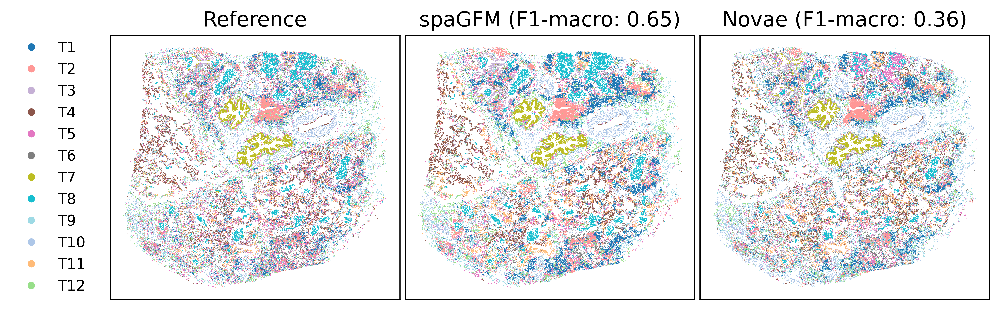

In [6]:
# Exact layout from check_knn_TNiche_res_sample_best_plot.ipynb.
cmap = plt.get_cmap('tab20', len(classes))
panel_specs = [('reference_code', 'Reference'), ('spaGFM_8_code', f'spaGFM (F1-macro: {best_result["f1_macro"]:.2f})'), ('Novae_code', f'Novae (F1-macro: {novae_f1:.2f})')]
figure_height = 3
bottom, top = 0.05, 0.88
map_height = figure_height * (top - bottom)
x_span = plot_data['x_centroid'].max() - plot_data['x_centroid'].min()
y_span = plot_data['y_centroid'].max() - plot_data['y_centroid'].min()
if x_span <= 0 or y_span <= 0:
    raise ValueError('Spatial coordinates must span both X and Y dimensions')
panel_width = map_height * x_span / y_span
legend_width, gap_width, right_margin = 1.0, 0.05, 0.05
figure_width = legend_width + 3 * panel_width + 2 * gap_width + right_margin
fig, axes = plt.subplots(1, 3, figsize=(figure_width, figure_height), sharex=True, sharey=True, dpi=600)
for ax, (column, title) in zip(axes, panel_specs):
    ax.scatter(plot_data['x_centroid'], plot_data['y_centroid'], c=plot_data[column], cmap=cmap, vmin=-0.5, vmax=len(classes) - 0.5, s=0.3, linewidths=0, rasterized=True)
    ax.set_title(title, fontsize=14)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
def numeric_label_key(item):
    code, class_name = item
    digits = ''.join(character for character in class_name if character.isdigit())
    return (int(digits) if digits else float('inf'), class_name)
legend_handles = [Line2D([0], [0], marker='o', color='none', markerfacecolor=cmap(code), markeredgewidth=0, markersize=5, label=class_name) for code, class_name in sorted(enumerate(classes), key=numeric_label_key)]
axes[0].legend(handles=legend_handles, loc='center right', bbox_to_anchor=(-0.04, 0.5), frameon=False, fontsize=10)
fig.subplots_adjust(left=legend_width / figure_width, right=1 - right_margin / figure_width, bottom=bottom, top=top, wspace=gap_width / panel_width)
plt.show()

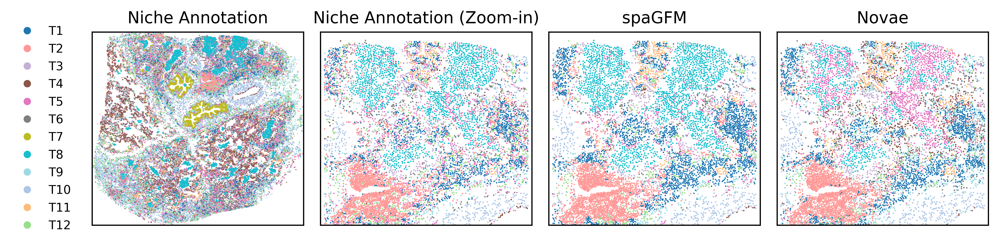

In [7]:
# Exact zoomed-comparison settings from check_knn_TNiche_res_sample_best_plot.ipynb.
x1 = plot_data['x_centroid'].quantile(0.45)
x2 = plot_data['x_centroid'].quantile(0.85)
y1 = plot_data['y_centroid'].quantile(0)
y2 = plot_data['y_centroid'].quantile(0.35)
subregion_data = plot_data.loc[plot_data['x_centroid'].between(x1, x2) & plot_data['y_centroid'].between(y1, y2)].copy()
if subregion_data.empty:
    raise ValueError('The selected subregion contains no cells')
region_cmap = plt.get_cmap('tab20', len(classes))
region_norm = BoundaryNorm(np.arange(-0.5, len(classes) + 0.5, 1), region_cmap.N)
def limits_with_aspect(data, target_aspect):
    x_min, x_max = data['x_centroid'].min(), data['x_centroid'].max()
    y_min, y_max = data['y_centroid'].min(), data['y_centroid'].max()
    x_span, y_span = x_max - x_min, y_max - y_min
    if x_span / y_span < target_aspect:
        padding = (target_aspect * y_span - x_span) / 2
        x_min, x_max = x_min - padding, x_max + padding
    else:
        padding = (x_span / target_aspect - y_span) / 2
        y_min, y_max = y_min - padding, y_max + padding
    return (x_min, x_max), (y_min, y_max)
global_aspect = (plot_data['x_centroid'].max() - plot_data['x_centroid'].min()) / (plot_data['y_centroid'].max() - plot_data['y_centroid'].min())
global_limits = limits_with_aspect(plot_data, global_aspect)
subregion_limits = limits_with_aspect(subregion_data, global_aspect)
compact_panels = [(plot_data, 'reference_code', 'Niche Annotation', global_limits, 0.5), (subregion_data, 'reference_code', 'Niche Annotation (Zoom-in)', subregion_limits, 1.0), (subregion_data, 'spaGFM_8_code', 'spaGFM', subregion_limits, 1.0), (subregion_data, 'Novae_code', 'Novae', subregion_limits, 1.0)]
fig, axes = plt.subplots(1, 4, figsize=(10, 8), sharex=False, sharey=False, dpi=600)
for ax, (panel_data, column, title, (x_limits, y_limits), point_size) in zip(axes, compact_panels):
    ax.scatter(panel_data['x_centroid'], panel_data['y_centroid'], c=panel_data[column], cmap=region_cmap, norm=region_norm, s=point_size, linewidths=0, rasterized=True)
    ax.set_title(title, fontsize=11)
    ax.set_xlim(*x_limits)
    ax.set_ylim(*y_limits)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
def legend_sort_key(item):
    code, class_name = item
    digits = ''.join(character for character in class_name if character.isdigit())
    return (int(digits) if digits else float('inf'), class_name)
legend_handles = [Line2D([0], [0], marker='o', color='none', markerfacecolor=region_cmap(code), markeredgewidth=0, markersize=5, label=class_name) for code, class_name in sorted(enumerate(classes), key=legend_sort_key)]
axes[0].legend(handles=legend_handles, loc='center right', bbox_to_anchor=(-0.05, 0.5), frameon=False, fontsize=8)
fig.subplots_adjust(left=0.15, right=0.99, bottom=0.03, top=0.86, wspace=0.08)
plt.show()